In [3]:
!pip install celluloid plotly -q


[notice] A new release of pip is available: 23.1 -> 23.1.2
[notice] To update, run: python3.9 -m pip install --upgrade pip


In [12]:
import os
import gc
import matplotlib.pyplot as plt
from typing import Union, Optional
from PIL import Image
from IPython.display import HTML, display

import numpy as np
import pandas as pd
import plotly.express as px
from tqdm import tqdm
from celluloid import Camera

import warnings
warnings.simplefilter('ignore')

In [9]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [10]:
plt.rcParams['figure.dpi'] = 350
plt.style.use('dark_background')

In [11]:
class CFG:
    layers_count: int = 65
    train_volumes_path_template: str = "/kaggle/input/vesuvius-challenge-ink-detection/train/{}/surface_volume"
    test_volumes_path_template: str = "/kaggle/input/vesuvius-challenge-ink-detection/test/{}/surface_volume"
    tif_template: str = "{:02d}.tif"

In [12]:
def load_volume(volume_path: str, disable_tqdm: bool = False) -> np.ndarray:
    volume = []
    for i in tqdm(range(CFG.layers_count), disable=disable_tqdm):
        img = Image.open(f"{volume_path}/{CFG.tif_template.format(i)}")
        arr = np.array(img)
        volume.append(arr)
    
    return volume

In [13]:
def animate_volume(
    volume: Union[np.ndarray, str], 
    ir_photo: Optional[np.ndarray] = None,
    inklabels: Optional[np.ndarray] = None,
) -> None:
    
    plt.rcParams['figure.dpi'] = 350
    plt.style.use('dark_background')
    
    if isinstance(volume, str):
        volume = load_volume(volume, disable_tqdm=True)

    # creating figure subplot
    if ir_photo and inklabels:
        fig, (ax_ir, ax, ax_il) = plt.subplots(1, 3)
    elif ir_photo:
        fig, (ax, ax_ir) = plt.subplots(1, 2)
    elif inklabels:
        fig, (ax, ax_il) = plt.subplots(1, 2)
    else:
        fig, ax = plt.subplots()
    
    camera = Camera(fig) # define the camera that gets the fig we'll plot
    for i in range(CFG.layers_count):
        ax.axis('off')
        ax.text(
            0.5, 1.08, f"Layer {i+1}/{CFG.layers_count}", fontweight='bold', fontsize=18,
            transform=ax.transAxes, horizontalalignment='center'
        )
        ax.imshow(volume[0], cmap='gray') # plot volume layer
        
        if ir_photo:
            ax_ir.imshow(ir_photo, cmap='gray')
            ax_ir.axis('off')
            ax_ir.text(
                0.5, -0.13, "Infrared photo", style='italic', fontsize=15,
                transform=ax_ir.transAxes, horizontalalignment='center'
            )
        
        if inklabels:
            ax_il.imshow(inklabels, cmap='gray')
            ax_il.axis('off')
            ax_il.text(
                0.5, -0.13, "Ink labels", style='italic', fontsize=15,
                transform=ax_il.transAxes, horizontalalignment='center'
            )
        
        
        camera.snap() # the camera takes a snapshot of the plot
        
        del volume[0]
        gc.collect()

    plt.close(fig) # close figure

    animation = camera.animate() # get plt animation
    
    fix_video_adjust = '<style> video {margin: 0px; padding: 0px; width:100%; height:auto;} </style>'
    display(
        HTML(fix_video_adjust + animation.to_html5_video())
    ) # displaying the animation
    
    del camera
    del animation
    gc.collect()

In [14]:
def get_concat_v(im1: Image, im2: Image) -> Image:
    dst = Image.new('RGB', (im1.width, im1.height + im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (0, im1.height))
    return dst

<a id="1"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 1. Overview directories</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ <code>[train/test]/[fragment_id]/surface_volume/[image_id].tif</code> slices from the 3d x-ray surface volume. Each file contains a greyscale slice in the z-direction. Each fragment contains <b>65 slices</b>. Combined this image stack gives us <code>width * height * 65</code> number of voxels per fragment. You can expect two fragments in the hidden test set, which together are roughly the same as the first training fragment. The sample slices available to download in the test folders are simply copied from training fragment one.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ <code>train/</code> directory has <b>3</b> 3d x-ray surface volumes.</p>

In [15]:
sorted(os.listdir("/kaggle/input/vesuvius-challenge-ink-detection/train"))

['1', '2', '3']

<p style="font-family: consolas; font-size: 16px;">⚪ <code>test/</code> directory has <b>3</b> 3d x-ray surface volumes. Which together are roughly the same as the <b>1st training fragment</b></p>

In [16]:
sorted(os.listdir("/kaggle/input/vesuvius-challenge-ink-detection/test"))

['a', 'b']

<a id="2"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 2. Overview the 1st volume of the <i>train/</i> directory</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Each of train volumes has next files: </p>

* <p style="font-family: consolas; font-size: 16px;"><code>mask.png</code> — a binary mask of which pixels contain data.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>ir.png</code> — the infrared photo on which the binary mask is based.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>inklabels.png</code> — a binary mask of the ink vs no-ink labels.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>inklabels_rle.csv</code> — a run-length-encoded version of the labels, generated using this script. This is the same format as you should make your submission in.</p>

In [17]:
os.listdir("/kaggle/input/vesuvius-challenge-ink-detection/train/1")

['inklabels.png', 'inklabels_rle.csv', 'ir.png', 'mask.png', 'surface_volume']

<a id="2.1"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 2.1 Consider <i>mask.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Let's load the mask</p>

In [12]:
train_1_mask = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/1/mask.png")

In [13]:
print(f"Mask image size: {color.BOLD}{color.CYAN}{train_1_mask.size}{color.END}")

Mask image size: (6330, 8181)


<p style="font-family: consolas; font-size: 16px;">⚪ And plot it</p>

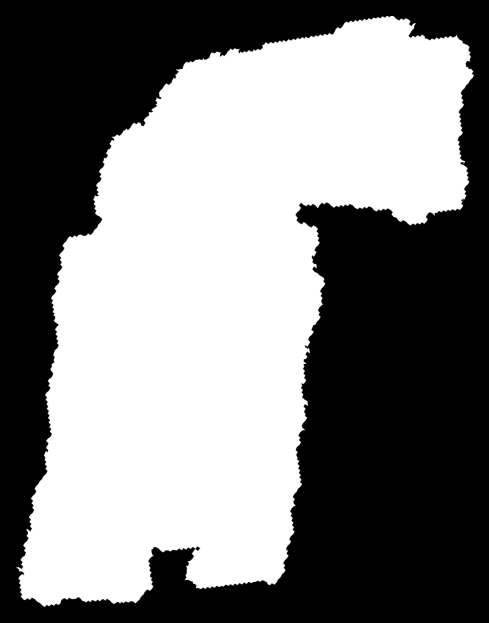

In [14]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_1_mask);

<p style="font-family: consolas; font-size: 16px;">⚪ OK there is nothing interesting in the mask, so let's take a look at <code>ir.png</code> image.</p>

<a id="2.2"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 2.2 Consider <i>ir.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Load the infrared image</p>

In [15]:
train_1_ir = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/1/ir.png")

In [16]:
print(f"Infrared image size: {color.BOLD}{color.CYAN}{train_1_ir.size}{color.END}")

Infrared image size: (6330, 8181)


<p style="font-family: consolas; font-size: 16px;">⚪ As you can see in the image there are some fragments of words. The approximate number of letters on the fragment is about 20.</p>

<p style="font-family: consolas; font-size: 16px;">🔴 It is important to note that there is no infrared image in the test dataset, only a mask and 65 volume layers from a 3d x-ray.</p>

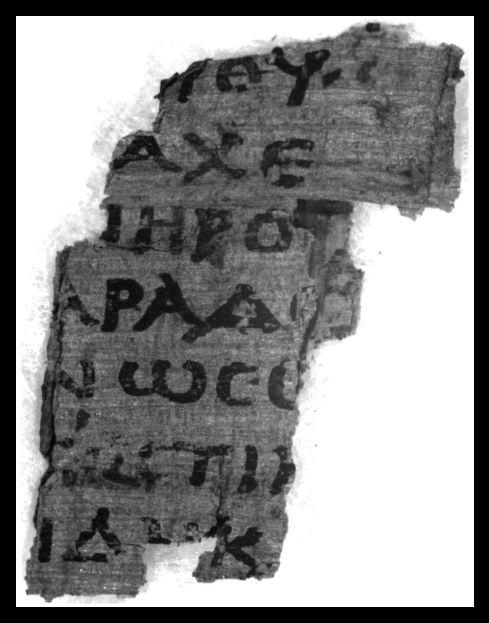

In [17]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_1_ir, cmap='gray');

<a id="2.3"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 2.3 Consider <i>inklabels.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Load <code>inklabels.png</code> image.</p>

In [18]:
train_1_inklabels = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/1/inklabels.png")

In [19]:
print(f"Inklabels image size: {color.BOLD}{color.CYAN}{train_1_inklabels.size}{color.END}")

Inklabels image size: (6330, 8181)


<p style="font-family: consolas; font-size: 16px;">⚪ You are supposed to use it as a prediction reference. Thus, you predict a binary semantic mask from 3D X-ray 65 volume layers and check its intersection with the inklabels mask.</p>

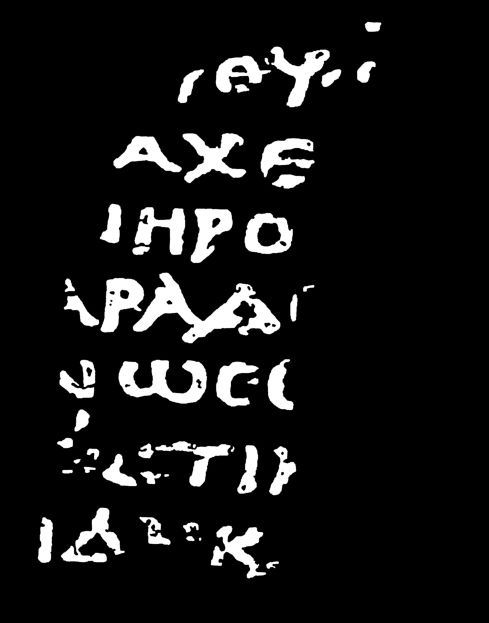

In [20]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_1_inklabels, cmap='gray');

<p style="font-family: consolas; font-size: 16px;">⚪ Let's see the distribution of ink on the first training instance. To calculate the distribution, I consider it optimal to first take a mask, and only after that calculate the distribution, since it is in this way that it is assumed that training and inference will take place.</p>

In [21]:
# conver to np.ndarray
train_1_inklabels_np = np.array(train_1_inklabels)
train_1_mask_np = np.array(train_1_mask, dtype=np.bool8)

# reassign new value for empty space 
train_1_inklabels_np[np.logical_not(train_1_mask_np)] = 2

# get counts for each label
train_1_pix_counts = np.unique(
    train_1_inklabels_np, 
    return_counts=True
)[1]

/tmp/ipykernel_18151/3634875842.py:3: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  train_1_mask_np = np.array(train_1_mask, dtype=np.bool8)


<p style="font-family: consolas; font-size: 16px;">⚪ On visualization you will see next 3 labels: </p>

* <p style="font-family: consolas; font-size: 16px;"><code>No ink</code> — is inside the mask, but is not ink.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>Ink</code> — is inside the mask and is ink.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>Empty space</code> — is outside the mask.</p>

In [22]:
fig = px.bar(
    x=["No ink", "Ink", "Empty space"], y=train_1_pix_counts,
    color_discrete_sequence=['darkgoldenrod']
)

fig.update_layout(
    xaxis_title="Label", yaxis_title="Pixel count",
    title={
        'text': "Distribution of Ink on the 1st train instance",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)
fig.show()

<a id="2.4"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 2.4 Consider <i>inklabels_rle.csv</i> file</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ There is nothing interesting in this file. It's just a run-length-encoded version of the <code>inklabels.png</code> image, generated using <a href="https://gist.github.com/janpaul123/ca3477c1db6de4346affca37e0e3d5b0"><strong>this script</strong></a>.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ It's important to note that this is in the same format as you should make your <a href="https://www.kaggle.com/competitions/vesuvius-challenge-ink-detection/overview/evaluation"><strong>submission in</strong></a>.</p>

In [23]:
pd.read_csv("/kaggle/input/vesuvius-challenge-ink-detection/train/1/inklabels_rle.csv")

,Id,Predicted
0,1,606211 19 612538 26 618867 39 625196 44 631525...


<a id="2.5"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 2.5 Consider <i>surface_volumes/</i> directory</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ As mentioned above these are slices from the 3d x-ray surface volume. Each file contains a <b>greyscale slice in the z-direction</b>. Each fragment contains <b>65 slices</b>. Combined this image stack gives us <code>65 * height * width</code> number of voxels per fragment.</p>

In [24]:
first_train_volume = CFG.train_volumes_path_template.format(1)

In [25]:
train_volume_1 = load_volume(first_train_volume)

100%|██████████| 65/65 [02:58<00:00,  2.75s/it]


In [26]:
print(f"1st train volume size: {color.BOLD}{color.CYAN}{train_volume_1[0].shape}{color.END}")

1st train volume size: (8181, 6330)


<p style="font-family: consolas; font-size: 16px;">⚪ The whole volume is huge, let's see exactly how.</p>

In [27]:
bytes_size = CFG.layers_count * train_volume_1[0].size * train_volume_1[0].itemsize
print(f"Memory size of 1st train volume in bytes: {color.BOLD}{color.PURPLE}{bytes_size}{color.END} B")
print(f"Memory size of 1st train volume in gigabytes: {color.BOLD}{color.PURPLE}{bytes_size / 1024**3}{color.END} GB")

Memory size of 1st train volume in bytes: 6732144900 B
Memory size of 1st train volume in gigabytes: 6.269798520952463 GB


<p style="font-family: consolas; font-size: 16px;">⚪ For a better understanding of how the layers relate to each other, I made an <b>animation with the transition from one layer to another</b>. And so for all 65 layers.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ As noted in the description of this competition, it is visually almost impossible to notice any ink on these images. But together they form a coherent picture, which, I hope, can be picked up very easily by a neural network.</p>

In [29]:
animate_volume(first_train_volume, ir_photo=train_1_ir)

<p style="font-family: consolas; font-size: 16px;">⚪ And let's animate volume next to its ink labels mask.</p>

In [30]:
# animate_volume(first_train_volume, inklabels=train_1_inklabels)

In [31]:
# animate_volume(first_train_volume, train_1_ir, train_1_inklabels)

<a id="3"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 3. Overview the 2nd volume of the <i>train/</i> directory</b></div>

<a id="3.1"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 3.1 Consider <i>mask.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Let's load the mask</p>

In [18]:
train_2_mask = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/2/mask.png")

/usr/local/lib/python3.9/dist-packages/PIL/Image.py:3176: DecompressionBombWarning: Image size (140973980 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [19]:
print(f"Mask image size: {color.BOLD}{color.CYAN}{train_2_mask.size}{color.END}")

Mask image size: (9506, 14830)


<p style="font-family: consolas; font-size: 16px;">⚪ And plot it</p>

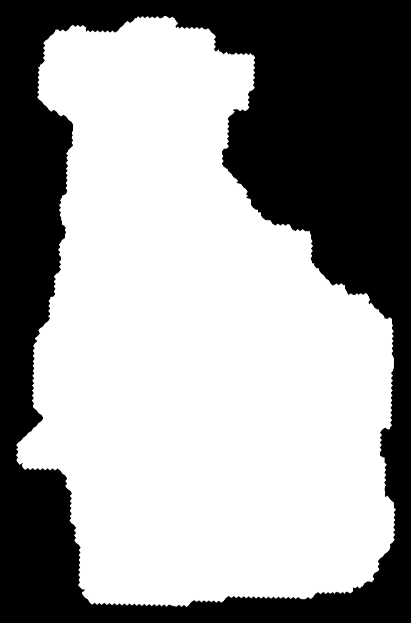

In [20]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_2_mask);

<p style="font-family: consolas; font-size: 16px;">⚪ OK there is nothing interesting in the mask, so let's take a look at <code>ir.png</code> image.</p>

<a id="3.2"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 3.2 Consider <i>ir.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Load the infrared image</p>

In [21]:
train_2_ir = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/2/ir.png")

In [22]:
print(f"Infrared image size: {color.BOLD}{color.CYAN}{train_2_ir.size}{color.END}")

Infrared image size: (9506, 14830)


<p style="font-family: consolas; font-size: 16px;">⚪ As you can see in the image there are some fragments of words. The approximate number of letters on the fragment is about 65.</p>

<p style="font-family: consolas; font-size: 16px;">🔴 It is important to note that there is no infrared image in the test dataset, only a mask and 65 volume layers from a 3d x-ray.</p>

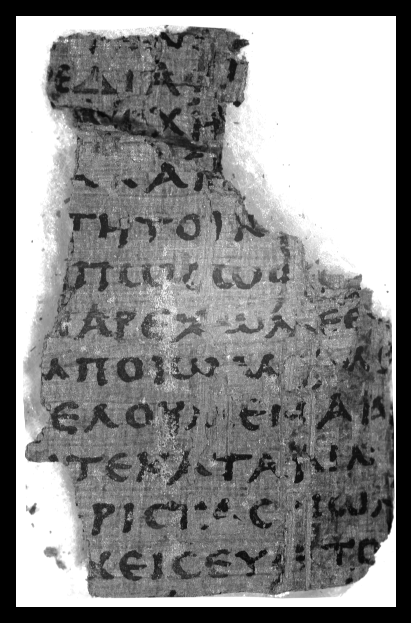

In [23]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_2_ir, cmap='gray');

<a id="3.3"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 3.3 Consider <i>inklabels.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Load <code>inklabels.png</code> image.</p>

In [24]:
train_2_inklabels = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/2/inklabels.png")

In [25]:
print(f"Inklabels image size: {color.BOLD}{color.CYAN}{train_2_inklabels.size}{color.END}")

Inklabels image size: (9506, 14830)


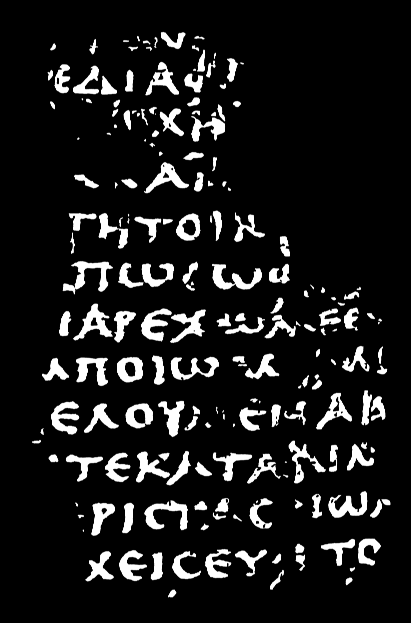

In [26]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_2_inklabels, cmap='gray');

<p style="font-family: consolas; font-size: 16px;">⚪ Let's see the distribution of ink on the second training instance. To calculate the distribution, I consider it optimal to first take a mask, and only after that calculate the distribution, since it is in this way that it is assumed that training and inference will take place.</p>

In [27]:
# conver to np.ndarray
train_2_inklabels_np = np.array(train_2_inklabels)
train_2_mask_np = np.array(train_2_mask, dtype=np.bool8)

# reassign new value for empty space 
train_2_inklabels_np[np.logical_not(train_2_mask_np)] = 2

# get counts for each label
train_2_pix_counts = np.unique(
    train_2_inklabels_np, 
    return_counts=True
)[1]

/tmp/ipykernel_29993/3076329880.py:3: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  train_2_mask_np = np.array(train_2_mask, dtype=np.bool8)


<p style="font-family: consolas; font-size: 16px;">⚪ On visualization you will see next 3 labels: </p>

* <p style="font-family: consolas; font-size: 16px;"><code>No ink</code> — is inside the mask, but is not ink.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>Ink</code> — is inside the mask and is ink.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>Empty space</code> — is outside the mask.</p>

In [28]:
fig = px.bar(
    x=["No ink", "Ink", "Empty space"], y=train_2_pix_counts,
    color_discrete_sequence=['cadetblue']
)

fig.update_layout(
    xaxis_title="Label", yaxis_title="Pixel count",
    title={
        'text': "Distribution of Ink on the 2nd train instance",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)
fig.show()

<a id="3.4"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 3.4 Consider <i>inklabels_rle.csv</i> file</b></div>

In [29]:
pd.read_csv("/kaggle/input/vesuvius-challenge-ink-detection/train/2/inklabels_rle.csv")

,Id,Predicted
0,2,4062741 15 4072241 25 4081742 31 4091232 2 409...


<a id="3.5"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 3.5 Consider <i>surface_volumes/</i> directory</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ As mentioned above these are slices from the 3d x-ray surface volume. Each file contains a <b>greyscale slice in the z-direction</b>. Each fragment contains <b>65 slices</b>. Combined this image stack gives us <code>65 * height * width</code> number of voxels per fragment.</p>

In [30]:
second_train_volume = CFG.train_volumes_path_template.format(2)

In [31]:
train_volume_2 = load_volume(second_train_volume)

  0%|          | 0/65 [00:00<?, ?it/s]/usr/local/lib/python3.9/dist-packages/PIL/Image.py:3176: DecompressionBombWarning:

Image size (140973980 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

 78%|███████▊  | 51/65 [04:47<01:19,  5.67s/it]

: 

: 

In [ ]:
print(f"2st train volume size: {color.BOLD}{color.CYAN}{train_volume_2[0].shape}{color.END}")

<p style="font-family: consolas; font-size: 16px;">⚪ The whole volume is huge, let's see exactly how.</p>

In [ ]:
bytes_size = CFG.layers_count * train_volume_2[0].size * train_volume_2[0].itemsize
print(f"Memory size of 2st train volume in bytes: {color.BOLD}{color.PURPLE}{bytes_size}{color.END} B")
print(f"Memory size of 2st train volume in gigabytes: {color.BOLD}{color.PURPLE}{bytes_size / 1024**3}{color.END} GB")

<p style="font-family: consolas; font-size: 16px;">⚪ For a better understanding of how the layers relate to each other, I made an <b>animation with the transition from one layer to another</b>. And so for all 65 layers.</p>

In [ ]:
animate_volume(second_train_volume, ir_photo=train_2_ir)

<p style="font-family: consolas; font-size: 16px;">⚪ And let's animate volume next to its ink labels mask.</p>

In [ ]:
# animate_volume(second_train_volume, inklabels=train_2_inklabels)

<a id="4"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 4. Overview the 3rd volume of the <i>train/</i> directory</b></div>

<a id="4.1"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 4.1 Consider <i>mask.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Let's load the mask</p>

In [10]:
train_3_mask = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/3/mask.png")

In [11]:
print(f"Mask image size: {color.BOLD}{color.CYAN}{train_3_mask.size}{color.END}")

Mask image size: (5249, 7606)


<p style="font-family: consolas; font-size: 16px;">⚪ And plot it</p>

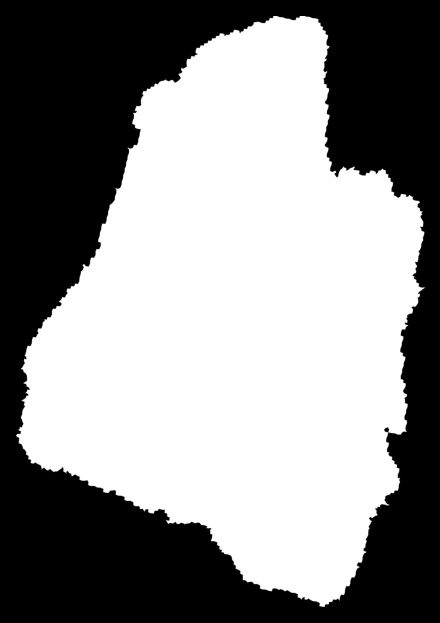

In [12]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_3_mask);

<p style="font-family: consolas; font-size: 16px;">⚪ OK there is nothing interesting in the mask, so let's take a look at <code>ir.png</code> image.</p>

<a id="4.2"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 4.2 Consider <i>ir.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Load the infrared image</p>

In [13]:
train_3_ir = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/3/ir.png")

In [14]:
print(f"Infrared image size: {color.BOLD}{color.CYAN}{train_3_ir.size}{color.END}")

Infrared image size: (5249, 7606)


<p style="font-family: consolas; font-size: 16px;">⚪ As you can see in the image there are some fragments of words. The approximate number of letters on the fragment is about 15.</p>

<p style="font-family: consolas; font-size: 16px;">🔴 It is important to note that there is no infrared image in the test dataset, only a mask and 65 volume layers from a 3d x-ray.</p>

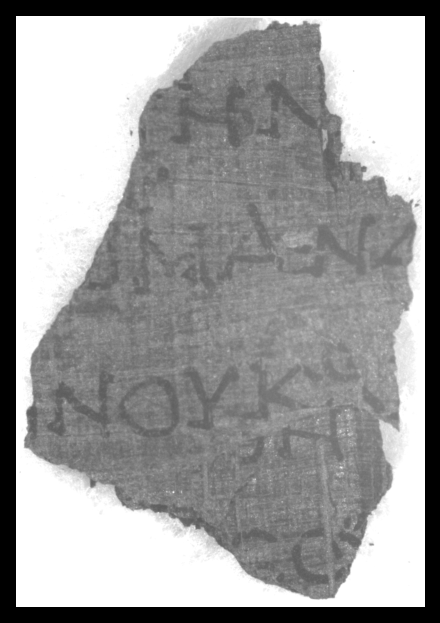

In [15]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_3_ir, cmap='gray');

<a id="4.3"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 4.3 Consider <i>inklabels.png</i> image</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Load <code>inklabels.png</code> image.</p>

In [16]:
train_3_inklabels = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/train/3/inklabels.png")

In [17]:
print(f"Inklabels image size: {color.BOLD}{color.CYAN}{train_3_inklabels.size}{color.END}")

Inklabels image size: (5249, 7606)


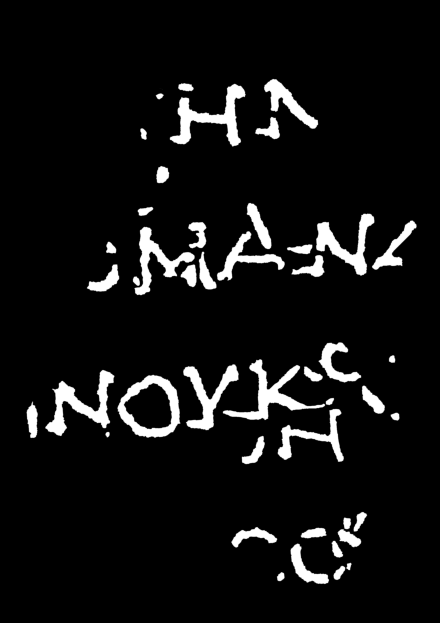

In [18]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(train_3_inklabels, cmap='gray');

<p style="font-family: consolas; font-size: 16px;">⚪ Let's see the distribution of ink on the third training instance. To calculate the distribution, I consider it optimal to first take a mask, and only after that calculate the distribution, since it is in this way that it is assumed that training and inference will take place.</p>

In [19]:
# conver to np.ndarray
train_3_inklabels_np = np.array(train_3_inklabels)
train_3_mask_np = np.array(train_3_mask, dtype=np.bool8)

# reassign new value for empty space 
train_3_inklabels_np[np.logical_not(train_3_mask_np)] = 2

# get counts for each label
train_3_pix_counts = np.unique(
    train_3_inklabels_np, 
    return_counts=True
)[1]

/tmp/ipykernel_26622/1163800476.py:3: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  train_3_mask_np = np.array(train_3_mask, dtype=np.bool8)


<p style="font-family: consolas; font-size: 16px;">⚪ On visualization you will see next 3 labels: </p>

* <p style="font-family: consolas; font-size: 16px;"><code>No ink</code> — is inside the mask, but is not ink.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>Ink</code> — is inside the mask and is ink.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>Empty space</code> — is outside the mask.</p>

In [20]:
fig = px.bar(
    x=["No ink", "Ink", "Empty space"], y=train_3_pix_counts,
    color_discrete_sequence=['darkslateblue']
)

fig.update_layout(
    xaxis_title="Label", yaxis_title="Pixel count",
    title={
        'text': "Distribution of Ink on the 3rd train instance",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)
fig.show()

<a id="4.4"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 4.4 Consider <i>inklabels_rle.csv</i> file</b></div>

In [21]:
pd.read_csv("/kaggle/input/vesuvius-challenge-ink-detection/train/3/inklabels_rle.csv")

,Id,Predicted
0,3,4323222 18 4328469 21 4333717 24 4333757 7 433...


<a id="4.5"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 4.5 Consider <i>surface_volumes/</i> directory</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ As mentioned above these are slices from the 3d x-ray surface volume. Each file contains a <b>greyscale slice in the z-direction</b>. Each fragment contains <b>65 slices</b>. Combined this image stack gives us <code>65 * height * width</code> number of voxels per fragment.</p>

In [22]:
third_train_volume = CFG.train_volumes_path_template.format(3)

In [23]:
train_volume_3 = load_volume(third_train_volume)

100%|██████████| 65/65 [01:44<00:00,  1.61s/it]


In [24]:
print(f"3st train volume size: {color.BOLD}{color.CYAN}{train_volume_3[0].shape}{color.END}")

3st train volume size: (7606, 5249)


<p style="font-family: consolas; font-size: 16px;">⚪ The whole volume is huge, let's see exactly how much.</p>

In [25]:
bytes_size = CFG.layers_count * train_volume_3[0].size * train_volume_3[0].itemsize
print(f"Memory size of 3st train volume in bytes: {color.BOLD}{color.PURPLE}{bytes_size}{color.END} B")
print(f"Memory size of 3st train volume in gigabytes: {color.BOLD}{color.PURPLE}{bytes_size / 1024**3}{color.END} GB")

Memory size of 3st train volume in bytes: 5190106220 B
Memory size of 3st train volume in gigabytes: 4.833663087338209 GB


<p style="font-family: consolas; font-size: 16px;">⚪ For a better understanding of how the layers relate to each other, I made an <b>animation with the transition from one layer to another</b>. And so for all 65 layers.</p>

In [26]:
animate_volume(third_train_volume, ir_photo=train_3_ir)

<p style="font-family: consolas; font-size: 16px;">⚪ And let's animate volume next to its ink labels mask.</p>

In [27]:
# animate_volume(third_train_volume, inklabels=train_3_inklabels)

<a id="5"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 5. Overview volumes of the <i>test/</i> directory</b></div>

<a id="5.1"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 5.1 Consider <i>mask.png</i> images</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Let's load masks</p>

In [28]:
test_a_mask = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/test/a/mask.png")
test_b_mask = Image.open("/kaggle/input/vesuvius-challenge-ink-detection/test/b/mask.png")

In [29]:
print(f"Mask a image size: {color.BOLD}{color.CYAN}{test_a_mask.size}{color.END}")
print(f"Mask b image size: {color.BOLD}{color.CYAN}{test_b_mask.size}{color.END}")

Mask a image size: (6330, 2727)
Mask b image size: (6330, 5454)


<p style="font-family: consolas; font-size: 16px;">⚪ And plot them</p>

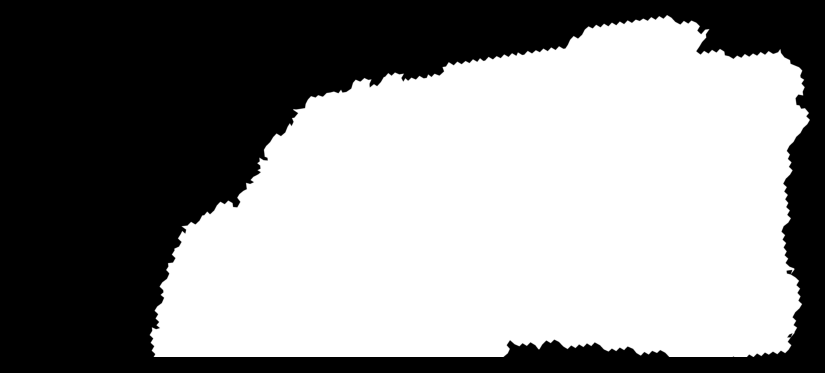

In [30]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(test_a_mask);

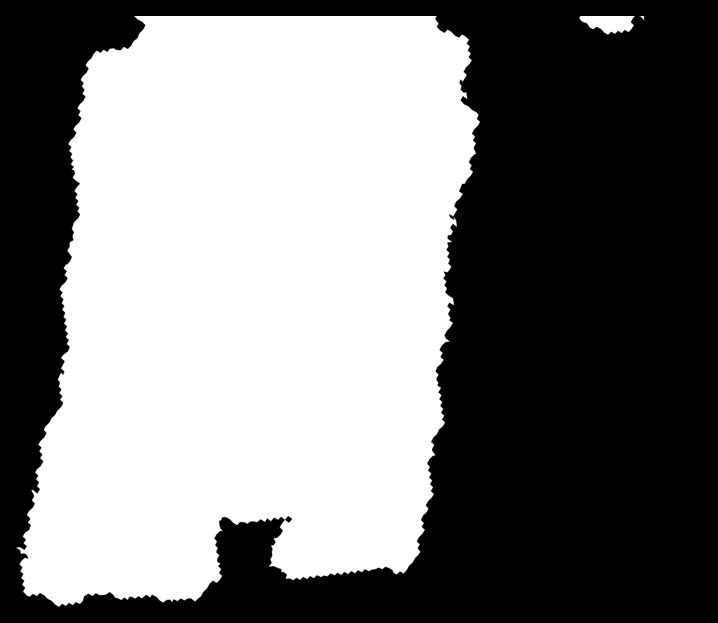

In [31]:
fig, ax = plt.subplots(dpi=160)
ax.axis('off')
ax.imshow(test_b_mask);

<p style="font-family: consolas; font-size: 16px;">⚪ Let's combine them and you'll see that it's just divided 1st train volume.</p>

In [32]:
concatenated_test_mask = get_concat_v(test_a_mask, test_b_mask)

NameError: name 'train_1_mask' is not defined

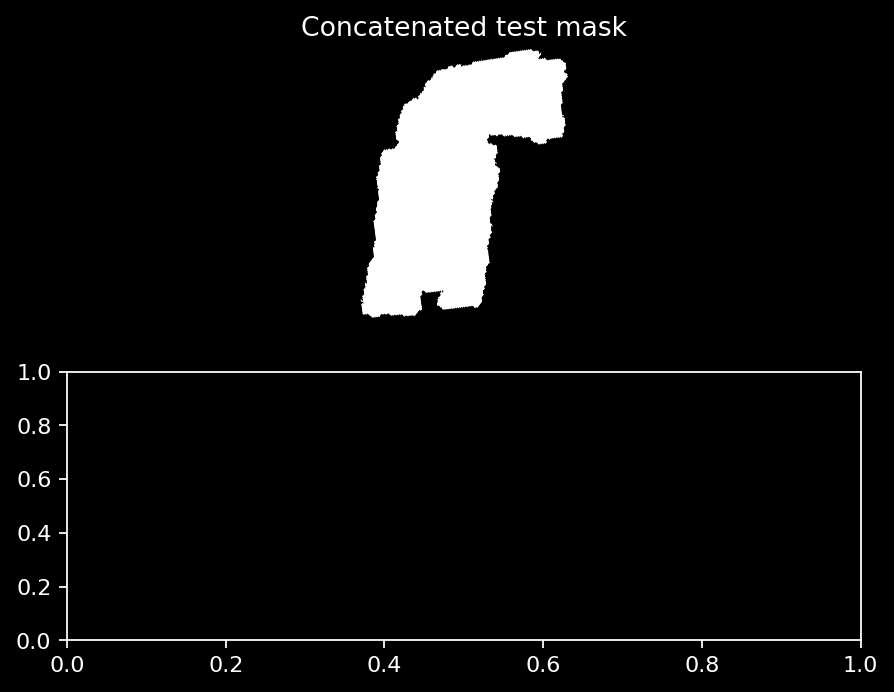

In [33]:
fig, axarr = plt.subplots(2, dpi=160)

axarr[0].imshow(concatenated_test_mask)
axarr[0].axis('off')
axarr[0].set_title("Concatenated test mask")

axarr[1].imshow(train_1_mask)
axarr[1].set_title("1st train volume mask")
axarr[1].axis('off');

In [ ]:
import cv2
id=15
tmp1=cv2.imread(f"/kaggle/input/vesuvius-challenge-ink-detection/train/1/surface_volume/{id}.tif",-1)
tmp2=cv2.imread(f"/kaggle/input/vesuvius-challenge-ink-detection/train/1/surface_volume/{id+1}.tif",-1)

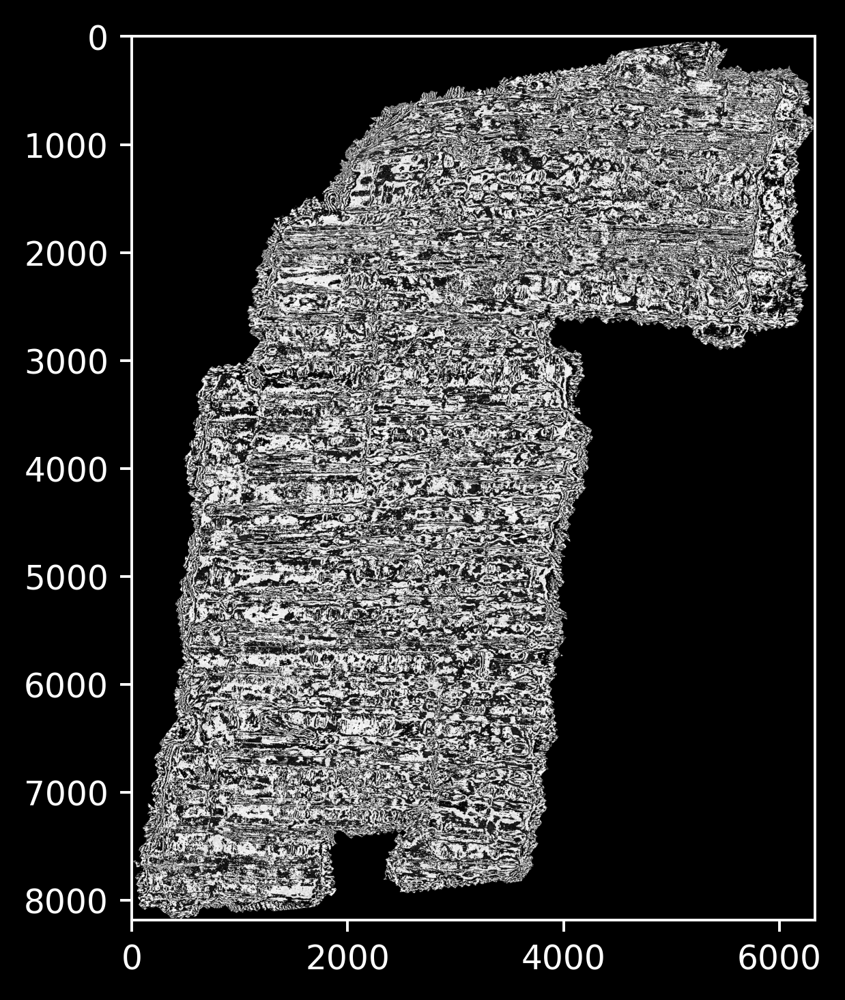

In [ ]:
plt.imshow(tmp1-tmp2,cmap='gray')

In [13]:
print(f"1: {np.array(Image.open('/kaggle/input/vesuvius-challenge-ink-detection/train/1/ir.png')).shape}")
print(f"2: {np.array(Image.open('/kaggle/input/vesuvius-challenge-ink-detection/train/2/ir.png')).shape}")
print(f"3: {np.array(Image.open('/kaggle/input/vesuvius-challenge-ink-detection/train/3/ir.png')).shape}")



1: (8181, 6330)
2: (14830, 9506)
3: (7606, 5249)


In [2]:
from tqdm import tqdm
import time
for i in tqdm(range(100)):
    time.sleep(1)

  4%|▍         | 4/100 [00:04<01:36,  1.01s/it]


KeyboardInterrupt: 